In [2]:
import pandas as pd

In [116]:
df = pd.read_csv('Africa_climate_change.csv')
df.head()

,DATE,PRCP,TAVG,TMAX,TMIN,COUNTRY
0,19800101 000000,NaN,54.0,61.0,43.0,Tunisia
1,19800101 000000,NaN,49.0,55.0,41.0,Tunisia
2,19800101 000000,0.0,72.0,86.0,59.0,Cameroon
3,19800101 000000,NaN,50.0,55.0,43.0,Tunisia
4,19800101 000000,NaN,75.0,91.0,NaN,Cameroon


In [117]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 464815 entries, 0 to 464814
Data columns (total 6 columns):
 #   Column   Non-Null Count   Dtype  
---  ------   --------------   -----  
 0   DATE     464815 non-null  object 
 1   PRCP     177575 non-null  float64
 2   TAVG     458439 non-null  float64
 3   TMAX     363901 non-null  float64
 4   TMIN     332757 non-null  float64
 5   COUNTRY  464815 non-null  object 
dtypes: float64(4), object(2)
memory usage: 21.3+ MB


In [4]:
df1 = df

In [5]:
# remplacer les Nan values par des moyennes ou par calcul simple min max avg
df1 = df
df1['TAVG'] = df1.apply(lambda row: (row['TMAX'] + row['TMIN']) / 2 
                      if pd.isna(row['TAVG']) and pd.notna(row['TMIN']) and pd.notna(row['TMAX']) 
                      else row['TAVG'], axis=1)
df1['TMAX'] = df1.apply(lambda row: (2 * row['TAVG']) - row['TMIN'] 
                      if pd.isna(row['TMAX']) and pd.notna(row['TAVG']) and pd.notna(row['TMIN']) 
                      else row['TMAX'], axis=1)
df1['TMIN'] = df1.apply(lambda row: (2 * row['TAVG']) - row['TMAX'] 
                      if pd.isna(row['TMIN']) and pd.notna(row['TAVG']) and pd.notna(row['TMAX']) 
                      else row['TMIN'], axis=1)

df1.info()      


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 464815 entries, 0 to 464814
Data columns (total 6 columns):
 #   Column   Non-Null Count   Dtype  
---  ------   --------------   -----  
 0   DATE     464815 non-null  object 
 1   PRCP     177575 non-null  float64
 2   TAVG     462592 non-null  float64
 3   TMAX     419687 non-null  float64
 4   TMIN     419687 non-null  float64
 5   COUNTRY  464815 non-null  object 
dtypes: float64(4), object(2)
memory usage: 21.3+ MB


In [118]:
# suppression des Nan values se trouvant dans TAVG, TMIN et TMAX
dataframe_new = df1.dropna(subset=['TAVG', 'TMAX', 'TMIN'], axis=0)
# reglage de l'affichage de l'heure 
dataframe_new['DATE'] = dataframe_new['DATE'] = pd.to_datetime(dataframe_new['DATE'], format='%Y%m%d %H%M%S')

C:\Users\Administrator\AppData\Local\Temp\ipykernel_7044\2816805008.py:4: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [120]:
dataframe_new.describe()

,DATE,PRCP,TAVG,TMAX,TMIN
count,419685,165067.000000,419685.000000,419685.000000,419685.000000
mean,2002-02-04 18:09:21.661245824,0.121433,77.010295,88.574915,65.701045
min,1980-01-01 00:00:00,0.000000,37.000000,41.000000,12.000000
25%,1992-02-11 00:00:00,0.000000,70.000000,80.000000,58.000000
50%,2002-05-08 00:00:00,0.000000,80.000000,90.000000,68.000000
75%,2012-04-25 00:00:00,0.000000,85.000000,98.000000,74.000000
max,2023-08-23 00:00:00,19.690000,109.000000,136.000000,103.000000
std,NaN,0.489096,11.586884,13.026556,11.599562


In [9]:
dataframe_new.isna().sum()

DATE            0
PRCP       254618
TAVG            0
TMAX            0
TMIN            0
COUNTRY         0
dtype: int64

In [10]:
dataframe_new.head()

,DATE,PRCP,TAVG,TMAX,TMIN,COUNTRY
0,1980-01-01,NaN,54.0,61.0,43.0,Tunisia
1,1980-01-01,NaN,49.0,55.0,41.0,Tunisia
2,1980-01-01,0.0,72.0,86.0,59.0,Cameroon
3,1980-01-01,NaN,50.0,55.0,43.0,Tunisia
4,1980-01-01,NaN,75.0,91.0,59.0,Cameroon


**Plot a line chart to show the average temperature fluctuations in Tunisia and Cameroon. Interpret the results.**

In [11]:
import plotly.express as px

In [12]:
# new dataset tunisia and cameroon
filtered_Tun_cam = dataframe_new[dataframe_new['COUNTRY'].isin(['Tunisia', 'Cameroon'])]
filtered_Tun_cam.head()

,DATE,PRCP,TAVG,TMAX,TMIN,COUNTRY
0,1980-01-01,NaN,54.0,61.0,43.0,Tunisia
1,1980-01-01,NaN,49.0,55.0,41.0,Tunisia
2,1980-01-01,0.0,72.0,86.0,59.0,Cameroon
3,1980-01-01,NaN,50.0,55.0,43.0,Tunisia
4,1980-01-01,NaN,75.0,91.0,59.0,Cameroon


In [13]:
fig = px.line(filtered_Tun_cam, x='DATE', y='TAVG',color='COUNTRY', title='TEMP AVG fluctuations in Tunisia and Cameroon')
fig.show()

c:\Users\Administrator\AppData\Local\Programs\Python\Python312\Lib\site-packages\plotly\express\_core.py:1980: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  sf: grouped.get_group(s if len(s) > 1 else s[0])
c:\Users\Administrator\AppData\Local\Programs\Python\Python312\Lib\site-packages\_plotly_utils\basevalidators.py:106: FutureWarning: The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result
  v = v.dt.to_pydatetime()


In [16]:
import plotly.graph_objs as go 
from plotly.subplots import make_subplots

In [17]:
# affichage pas tres clair, nous optons pour un affichage separe
tunisia = dataframe_new[dataframe_new['COUNTRY'] == 'Tunisia'] 
cameroon = dataframe_new[dataframe_new['COUNTRY'] == 'Cameroon'] 
# Create subplots 
fig = make_subplots(rows=2, cols=1, shared_xaxes=True, vertical_spacing=0.1, subplot_titles=('Temperature Trends for Tunisia', 'Temperature Trends for Cameroon'))
fig.add_trace(go.Scatter(x=tunisia['DATE'], y=tunisia['TAVG'], mode='lines', name='Country1'), row=1, col=1)
fig.add_trace(go.Scatter(x=cameroon['DATE'], y=cameroon['TAVG'], mode='lines', name='Country2'), row=2, col=1)
fig.update_layout(title='Temperature Trends by Country', showlegend=False)
fig.show()

In [18]:
# Zoom in to only include data between 1980 and 2005, try to customize the axes labels :
tunisia_1980_2005 = tunisia[(tunisia['DATE']>='1980-01-01') & (tunisia['DATE']<='2005-12-31')]
cameroon_1980_2005 = cameroon[(cameroon['DATE']>='1980-01-01') & (cameroon['DATE']<='2005-12-31')]

In [121]:
fig = make_subplots(rows=2, cols=1, shared_xaxes=True, vertical_spacing=0.1, subplot_titles=('Temperature Trends for Tunisia', 'Temperature Trends for Cameroon'))
fig.add_trace(go.Scatter(x=tunisia_1980_2005['DATE'], y=tunisia_1980_2005['TAVG'], mode='lines', name='Country1'), row=1, col=1)
fig.add_trace(go.Scatter(x=cameroon_1980_2005['DATE'], y=cameroon_1980_2005['TAVG'], mode='lines', name='Country2'), row=2, col=1)
fig.update_layout(title='Temperature Trends by Country 1980 - 2005', showlegend=False)
fig.show()

c:\Users\Administrator\AppData\Local\Programs\Python\Python312\Lib\site-packages\_plotly_utils\basevalidators.py:106: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result



In [21]:
# Create Histograms to show temperature distribution in Senegal between [1980,2000] and [2000,2023] (in the same figure).
# Describe the obtained results.
senegal = dataframe_new[dataframe_new['COUNTRY'] == 'Senegal'] 
senegal_1980_2000 = senegal[(senegal['DATE']>='1980-01-01') & (senegal['DATE']<='2000-12-31')]
senegal_2000_2023 = senegal[(senegal['DATE']>='2000-01-01') & (senegal['DATE']<='2023-12-31')]

In [22]:
senegal_1980_2000_new = senegal_1980_2000[['DATE', 'TAVG']]
senegal_2000_2023_new = senegal_2000_2023[['DATE', 'TAVG']]

In [23]:
import matplotlib.pyplot as plt

Text(0, 0.5, 'Evolution')

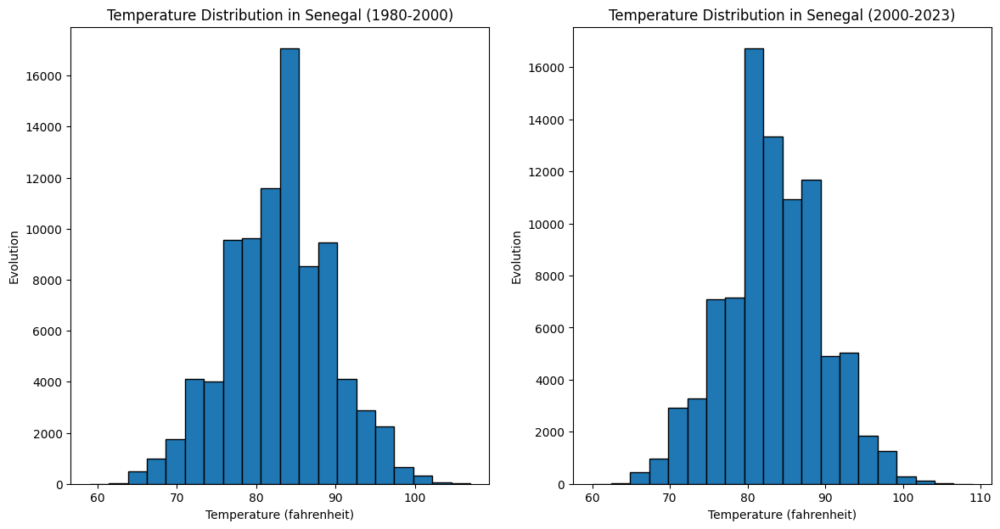

In [24]:
# Create histograms 
plt.figure(figsize=(14, 7)) 
plt.subplot(1, 2, 1)
plt.hist(senegal_1980_2000_new['TAVG'], bins=20, edgecolor='black', label='1980 - 2000')
plt.title('Temperature Distribution in Senegal (1980-2000)') 
plt.xlabel('Temperature (fahrenheit)') 
plt.ylabel('Evolution')
plt.subplot(1, 2, 2) 
plt.hist(senegal_2000_2023_new['TAVG'], bins=20, edgecolor='black', label='2000 - 2023') 
plt.title('Temperature Distribution in Senegal (2000-2023)') 
plt.xlabel('Temperature (fahrenheit)') 
plt.ylabel('Evolution')

Temperatures moyennes recenses au Senegal entre 80 et 90 fahrenheit de 1980 au l'an 2000
augmentation remarquable des temperatures entre 2000 et 2023 
le pic reste toujours le meme mais le nombre de jours avec des temperatures superieures a 85 fahrenheit a augmente de facon significative


Select the best chart to show the Average temperature per country.

In [ ]:

fig = px.bar(dataframe_new, x="COUNTRY", y="TAVG", color="COUNTRY", height=400)
fig.update_layout(title_text="Average temperature per country", xaxis_title="COUNTRY", yaxis_title="Temperature")
fig.update_traces(marker=dict(color='red', opacity=0.7, line=dict(color='red', width=1.5)))
fig.update_layout(coloraxis_colorbar=dict(title="COUNTRY"))
fig.show()
# prend beaucoup de temps pour s'executer


In [26]:
pays = dataframe_new['COUNTRY'].unique()
print(pays)

['Tunisia' 'Cameroon' 'Senegal' 'Egypt' 'Angola']


In [27]:
egypt = dataframe_new[dataframe_new['COUNTRY'] == 'Egypt'] 
angola = dataframe_new[dataframe_new['COUNTRY'] == 'Angola']
# 

In [75]:
dataframe_new['COUNTRY'].unique()

array(['Tunisia', 'Cameroon', 'Senegal', 'Egypt', 'Angola'], dtype=object)

In [122]:
import matplotlib.pyplot as plt

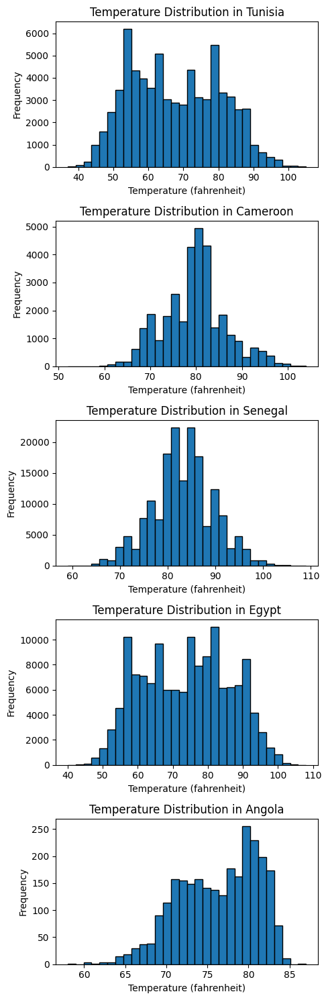

In [115]:
unique_countries = dataframe_new['COUNTRY'].unique()
num_countries = len(unique_countries)

fig, axes = plt.subplots(num_countries, 1, figsize=(5, 15)) 

for idx, country in enumerate(unique_countries):
    ax = axes[idx]
    ax.hist(dataframe_new[dataframe_new['COUNTRY'] == country]['TAVG'], bins=30, edgecolor='black', label='1980 - 2023')
    ax.set_title(f'Temperature Distribution in {country}')
    ax.set_xlabel('Temperature (fahrenheit)')
    ax.set_ylabel('Frequency')

plt.tight_layout() 
plt.show()



Make your own questions about the dataset and try to answer them using the appropriate visuals.

La data Set etait pleine de nan values
une transformation etait necessaire pour pouvoir analyser et rendre possible la visualisation des resultats
